<a href="https://colab.research.google.com/github/mojtabaSefidi/Machine-Learning-with-Graphs/blob/main/MLG_Ex1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Install Essential Packages

In [ ]:
!pip install -q torch-scatter -f https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
!pip install -q torch-sparse -f https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
!pip install -q torch-geometric

     |████████████████████████████████| 2.1 MB 8.3 MB/s 
     |████████████████████████████████| 467 kB 8.8 MB/s 


## Install Essential Libraries

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import torch
import networkx as nx
import torch_geometric
from torch_geometric.utils import to_networkx
from torch_geometric.datasets import Planetoid


## Read the Dataset

In [ ]:
dataset = Planetoid(root='/tmp/Citeseer', name='Citeseer')

Processing...
Done!


## Part 1 : Dataset Details

In [ ]:
def Information_Extaction(dataset):
  print('There is %d graph in the dataset.' %len(dataset))
  print('The graph has %d nodes.' %dataset[0].num_nodes)
  print('The graph has %d edges.' %dataset[0].num_edges)
  print('Each node has %d features.' %dataset[0].num_features)
  print('These are %d classes.'  %dataset.num_classes)
  print("The Average degree for each node is %d." %round((2*dataset[0].num_edges) / (dataset[0].num_nodes),4))
  print('There are %d training nodes in the dataset.' %dataset[0].train_mask.sum().item())
  return

In [ ]:
Information_Extaction(dataset)

There is 1 graph in the dataset.
The graph has 3327 nodes.
The graph has 9104 edges.
Each node has 3703 features.
These are 6 classes.
The Average degree for each node is 5.
There are 120 training nodes in the dataset.


## Part 2 : Class Data

In [ ]:
dataset[0]

Data(x=[3327, 3703], edge_index=[2, 9104], y=[3327], train_mask=[3327], val_mask=[3327], test_mask=[3327])

## Part 3 : Edges of Specific Node

In [ ]:
def show_edges(dataset,node_index):
  edges = dataset[0].edge_index
  x = torch.nonzero(edges[0]==node_index).ravel()
  return edges[:,x].T

In [ ]:
show_edges(dataset,node_index=1)

tensor([[   1,  158],
        [   1,  486],
        [   1, 1097],
        [   1, 2919],
        [   1, 2933]])

In [ ]:
show_edges(dataset,node_index=400)

tensor([[400, 862]])

In [ ]:
show_edges(dataset,node_index=1028)

tensor([[1028, 1557],
        [1028, 2320],
        [1028, 2605]])

## Part 4 : Graph visualization

In [ ]:
def visualize_graph(graph, figsize=32):
    plt.figure(figsize=(figsize,figsize))
    plt.xticks([])
    plt.yticks([])
    plt.title('Graph Visualization')
    graph = to_networkx(graph, to_undirected=True)
    nx.draw(graph)
    plt.show()

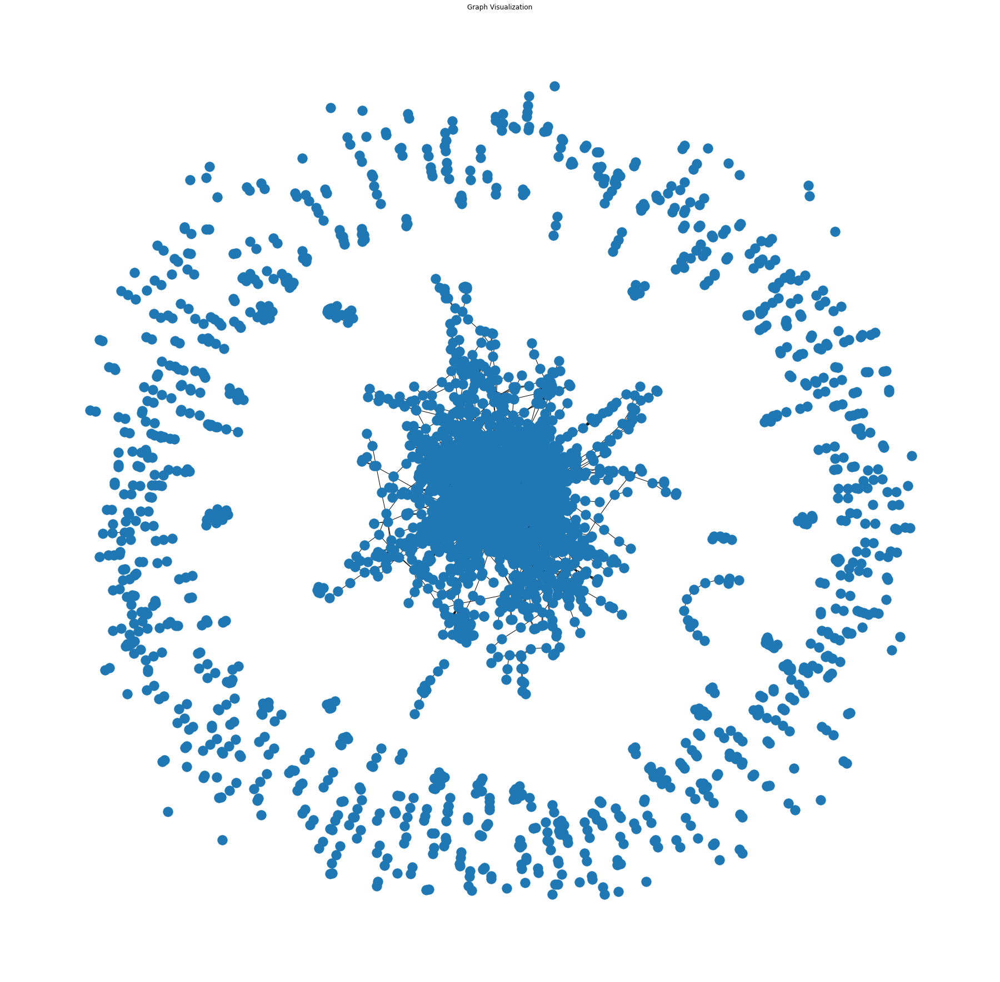

In [ ]:
visualize_graph(dataset[0])

In [ ]:
visualize_graph(dataset[0],300)

## Additional Libraries for GNN

In [ ]:
import torch.nn.functional as F
from torch.nn import Linear
from torch_geometric.nn import GCNConv

## Part 5 : GCN Implementation

In [ ]:
class GCN(torch.nn.Module):
    def __init__(
        self,
        num_neuron=256         
                 ):
        super().__init__()
        self.conv1 = GCNConv(dataset.num_node_features, num_neuron)
        self.conv2 = GCNConv(num_neuron, num_neuron)
        self.classifier = Linear(num_neuron, dataset.num_classes)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index

        x = self.conv1(x, edge_index)
        x = torch.tanh(x)
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        x = torch.tanh(x)
        return self.classifier(x)

In [ ]:
model = GCN(num_neuron = 128)
print(model)

GCN(
  (conv1): GCNConv(3703, 128)
  (conv2): GCNConv(128, 128)
  (classifier): Linear(in_features=128, out_features=6, bias=True)
)


## Test Performance

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
data = dataset[0].to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

model.train()
for epoch in range(10):
    optimizer.zero_grad()
    out = model(data)
    loss = criterion(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    if (epoch % 2 == 0):
      print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}')

Epoch: 000, Loss: 1.8009
Epoch: 002, Loss: 0.6950
Epoch: 004, Loss: 0.1298
Epoch: 006, Loss: 0.0325
Epoch: 008, Loss: 0.0103


In [ ]:
model.eval()
pred = model(data).argmax(dim=1)
correct = (pred[data.test_mask] == data.y[data.test_mask]).sum()
acc = int(correct) / int(data.test_mask.sum())
print(f'Accuracy: {acc:.4f}')

Accuracy: 0.6540
